# Imports

In [1]:
from pymongo import MongoClient
import pymongo
from datetime import datetime
from datetime import timedelta
import yfinance as yf
yf.pdr_override()
import matplotlib.pyplot as plt

# Connect To The DB

In [2]:
client = MongoClient('localhost', 27017)
db = client['482_Project']
collection = db['Reddit_Posts_Sentiment ']

# The Parameters for the Sim

In [3]:
# Sim parameters
starting_money = 10000.00
portfolio = {}
cash = starting_money
value_over_time = {}

# Gathering And Storing Historical Stock data

In [4]:
stocks = dict()

def get_stock_data(ticker, date):
    global stocks
    
    if ticker not in stocks:
        hist = yf.download(ticker, start=date, end="2024-03-30", progress=False)
        stocks[ticker] = hist["Close"]

    print(ticker)

    try:
        return stocks[ticker][date]
    except KeyError:
        return None

# Funtion To Get The Stocks Mentioned Out Of The Post

In [5]:
tickers = []
with open("tickers.txt", "r") as file:
    for line in file:
        tickers.append(line.strip())


In [6]:
def extract_stock_symbols(text):
    punc = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
    for p in punc:
        text = text.replace(p, ' ')

    # some edge casses for stock symbols
    text = text.replace('BRK', 'BRK-B')
    text = text.replace('ATH', 'ATH.TO')
    text = text.replace('ATCO', 'ACO-X.TO')
    
    words = text.split()
    potential_symbols = [word.strip() for word in words if word.isupper() and 2 <= len(word) <= 5]

    skip = ["I", "IPO","TLDR", "IMO", "P/E", "CAP", "US", "CEO", "ETF", "DD", "WSB", "YOLO", "401K", "AI", "UK", "TV", "COIN", "USA", "EDIT", "MMA", "EU", "EV", "BROS"]

    # Check each symbol with Yahoo Finance to confirm it's a valid stock symbol
    valid_symbols = []
    for symbol in potential_symbols:
        if symbol in skip:
            continue
        elif symbol in tickers:
            valid_symbols.append(symbol)

    return valid_symbols

# Looping Over Each Day

In [7]:
def next_weekday(d):
    if d.weekday() <5:
        return d 
    else:
        return d + timedelta(days=7-d.weekday()) 

In [8]:
for post in collection.find().sort("created_utc", pymongo.ASCENDING):
    title = post['title']
    content = post['content']
    sentiment = post['mod1']
    date = post['created_utc']
    date = next_weekday(date.date()).strftime("%Y-%m-%d")
    stocks_mentioned = extract_stock_symbols(title + ' ' + content)

    for stock in stocks_mentioned:
        hist = get_stock_data(stock, date)
        if hist is None:
            continue
        price = float(hist)

        if sentiment > 0:
            if cash > price:
                cash -= price
                if stock in portfolio:
                    portfolio[stock] += 1
                else:
                    portfolio[stock] = 1

        elif sentiment < 0:
            if stock in portfolio and portfolio[stock] > 0:
                cash += price
                portfolio[stock] -= 1

    value_over_time[date] = cash
    for stock in portfolio:
        hist = get_stock_data(stock, date)
        if hist is None:
            continue
        price = float(hist)
        value_over_time[date] += portfolio[stock] * price

NVDA
TDF
TRP
SM
FT
SM
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
NVDA
DM
TDF
TRP
SM
FT
PRT
PIM
INST
GME
DRS
GME
GME
GME
DRS
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
PLTR
SHOP
PLTR
SHOP
SHOP
PLTR
SHOP
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
EM
MSCI
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
SR
OCC
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
NIO
NIO
NIO
NIO
NIO
NIO
TSLA
BYD
NIO
BYD
TSLA
BYD
BYD
NIO
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
TDF
TRP
SM
FT
PRT
PIM
INST
CVNA
CAR
CAR
CVNA
CVNA
CAR
CAR
CAR
CAR
CAR
TDF
TRP
SM
FT
PRT
PIM
INST
SQ
TDF
TRP
SM
FT
PRT
PIM
INST
SQ
DRS
TDF
TRP
SM
FT
PRT
PIM
INST
SQ
DRS
TDF
TRP
SM
FT
PRT
PIM
INST
SQ
DRS
LUNR
LUNR
LUNR
TDF
TRP
SM
FT
PRT
PIM
INST
SQ
DRS
NVDA
NV


1 Failed download:
['EMP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2024-03-18 -> 2024-03-30)')


EMP
EMP
TDF
TRP
SM
FT
PRT
PIM
INST
SQ
DRS
NVDA
DCF
AMD
AG
UG
HPE
MARA
PANW
GME
LUNR
CB
HIMS
PLAY
GLP
OI
LNG
MU
MA
DM
SOUN
IBM
CLSK
DO
ECF
IT
NE
DC
SO
NSC
CSX
CP
CNI
OXY
MSTR
RSI
ATR
FDX
UPS
BOOT
BKE
VKTX
CPRI
TPR
OUT
SOFI
ACMR
NVO
BYND
PLTR
ME
TSLA
RIVN
IRS
RC
AN
AM
ET
KEY
TJX
AAP
SNOW
PM
WIRE
IONQ
DUOL
HOOD
ROKU
ALL
GOOD
ON
SR
OCC
EM
FANG
GSK
ASML
SAP
MT
DELL
ARM
SMCI
TFSA
BIT
STNG
IBKR
UBER
WWW
TALK
ASAN
VIA
CRSP
VRTX
AAPL
NTAP
SNA
SAFE
RXRX
ANY
EVER
YOU
BACK
REAL
CAN
TY
AMC
WBD
UP
DAY
FOR
SHOP
GOLD
NIO
NU
EOD
BBAI
PT
SA
OR
RILY
FF
FCF
ABNB
TSM
JL
JD
AIP
FL
OCEA
INTC
BA
MD
MAX
KC
NYCB
MAC
PB
SIRI
USB
BNS
CM
PRE
OPEN
LINK
NICE
CC
NMS
SOL
MRVL
DOCU
ROG
NYC
TRS
UBS
FREE
TELL
SEE
III
TTWO
SPOT
BABA
DIS
LOT
BE
ARR
BALY
RKLB
SMR
HUGE
FAT
PRO
AGNC
IGD
BBW
API
HBM
COO
DSP
ANF
PR
CSCO
MNKD
ZCMD
NOTE
MSM
COST
GOOG
LAC
BIG
ADBE
BEAT
GF
LULU
LULU
META
DELL
LULU
DM
DM
TDF
TRP
SM
FT
PRT
PIM
INST
SQ
DRS
NVDA
DCF
AMD
AG
UG
HPE
MARA
PANW
GME
LUNR
CB
HIMS
PLAY
GLP
OI
LNG
MU
MA
DM
SOUN
IBM
CLSK
DO
ECF


# The Main Plot

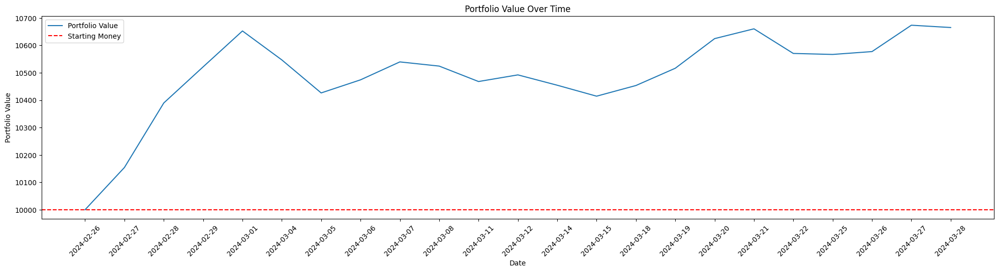

In [18]:
plt.figure(figsize=(20, 5))
plt.plot(value_over_time.keys(), value_over_time.values(), label='Portfolio Value')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.title('Portfolio Value Over Time')
plt.tight_layout()
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=45)

plt.axhline(y=starting_money, color='red', linestyle='--', label='Starting Money')

plt.legend()
plt.show()

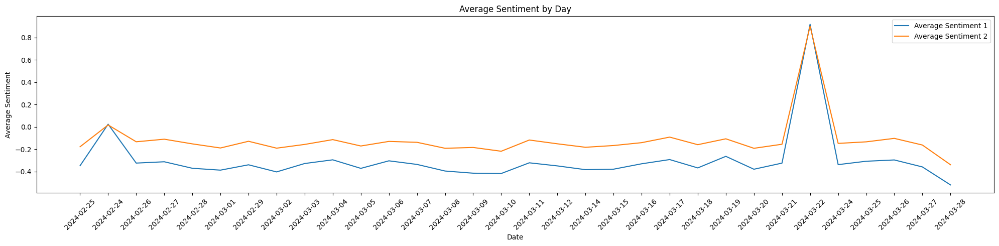

In [15]:
avg_sentiment1 = {}
avg_sentiment2 = {}

for post in collection.find():
    date = post['created_utc'].date().strftime("%Y-%m-%d")
    sentiment1 = post['mod1']
    sentiment2 = post['mod2']

    if date in avg_sentiment1:
        avg_sentiment1[date].append(sentiment1)
        avg_sentiment2[date].append(sentiment2)
    else:
        avg_sentiment1[date] = [sentiment1]
        avg_sentiment2[date] = [sentiment2]



for i, j in avg_sentiment1.items():
    avg_sentiment1[i] = sum(j) / len(j)

for i, j in avg_sentiment2.items():
    avg_sentiment2[i] = sum(j) / len(j)


# Plotting
plt.figure(figsize=(20, 5))
plt.plot(avg_sentiment1.keys(), avg_sentiment1.values(), label='Average Sentiment 1')
plt.plot(avg_sentiment2.keys(),avg_sentiment2.values(), label='Average Sentiment 2')
plt.xlabel('Date')
plt.ylabel('Average Sentiment')
plt.title('Average Sentiment by Day')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()